In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
import sys
sys.path.append('../')
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from fastai import *
from fastai.vision import *
from fastai.callbacks import *
from data.loadv2 import get_data, subsample
from data.utils import custom_cutout
from model.metrics import psnr, ssim
from model.losses import *

## Choose Devices

In [2]:
gpu_id = 4
num_cores = 4

In [3]:
torch.cuda.set_device(gpu_id)

# Model

## Initialization

In [4]:
nb_name = 'ssim-toddler-greyscale-svd'
data_pth = Path('/home/alaa/Dropbox/BPHO Staff/USF/')
lr_path = f'EM/training/trainsets/svd_70_150/'
hr_path = f'EM/training/trainsets/hr_greyscale/'
model_path = data_pth/f'EM/models/feat_loss/'

In [5]:
# loading the 1st round of data
bs_1 = 64
size_1 = 128
db = get_data(data_pth=data_pth, lr_dir=lr_path, hr_dir=hr_path,
             bs=bs_1, in_sz=size_1, out_sz=size_1, max_zoom=6)
db = subsample(db, seed=49)
db.c = 3

In [6]:
arch = models.resnet34
wd = 1e-3
superres_metrics = [F.mse_loss, psnr, ssim]
learn = unet_learner(db, arch, wd=wd, 
                         loss_func=ssim_log_loss,
                         metrics=superres_metrics, 
                         blur=False, 
                         norm_type=NormType.Weight, 
                         model_dir=model_path)
gc.collect()

0

In [7]:
# learn = learn.load(f'emsynth_005_unet.5')

In [8]:
# loading the 1st round of data
bs_1 = 64
size_1 = 128
db = get_data(data_pth=data_pth, lr_dir=lr_path, hr_dir=hr_path,
             bs=bs_1, in_sz=size_1, out_sz=size_1, max_zoom=6)
db = subsample(db, seed=49)

In [9]:
learn.data = db

In [10]:
learn.model_dir = model_path
print(learn.model_dir)

/home/alaa/Dropbox/BPHO Staff/USF/EM/models/feat_loss


In [11]:
# grab weights from a single channel
kernel_weights = learn.model[0][0].weight[:, 1, :, :].unsqueeze(1)
print(kernel_weights.shape)
# change first layer of resnet to single-channel
learn.model[0][0] = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
# stick the weights you grabbed earlier into your new first layer
learn.model[0][0].weight = torch.nn.Parameter(data=kernel_weights, requires_grad=True)
print(learn.model[0][0].weight.shape)
# change Merge layers to single-channel input images
learn.model[0][0] = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
learn.model[10][0][0] = nn.Conv2d(97, 97, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
learn.model[10][1][0] = nn.Conv2d(97, 97, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
learn.model[11][0] = nn.Conv2d(97, 1, kernel_size=(1, 1), stride=(1, 1))
learn.model.cuda();

torch.Size([64, 1, 7, 7])
torch.Size([64, 1, 7, 7])


## Exporting to pkl

## Load Model (optional)

In [12]:
# learn.model_dir = model_pth
# learn = learn.load(f'emsynth_005_unet.5')
# learn = learn.load(f'{nb_name}.3a')
# learn = learn.load(f'{nb_name}.1b')

In [13]:
learn.loss_func = ssim_log_loss
learn.loss_func

<function model.losses.ssim_log_loss(img1, img2, window_size=11, size_average=True)>

## Training

In [14]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


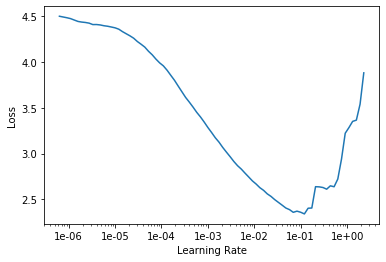

In [15]:
learn.recorder.plot()

### 1a

In [16]:
lr = 3e-3
learn.fit_one_cycle(3, max_lr=lr)
learn.save(f'{nb_name}.1a', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,0.896328,0.818472,0.415834,12.111394,0.442415,00:36
1,0.844332,0.739999,0.467404,11.775854,0.478604,00:36
2,0.827898,0.734568,0.414462,12.166563,0.481618,00:36


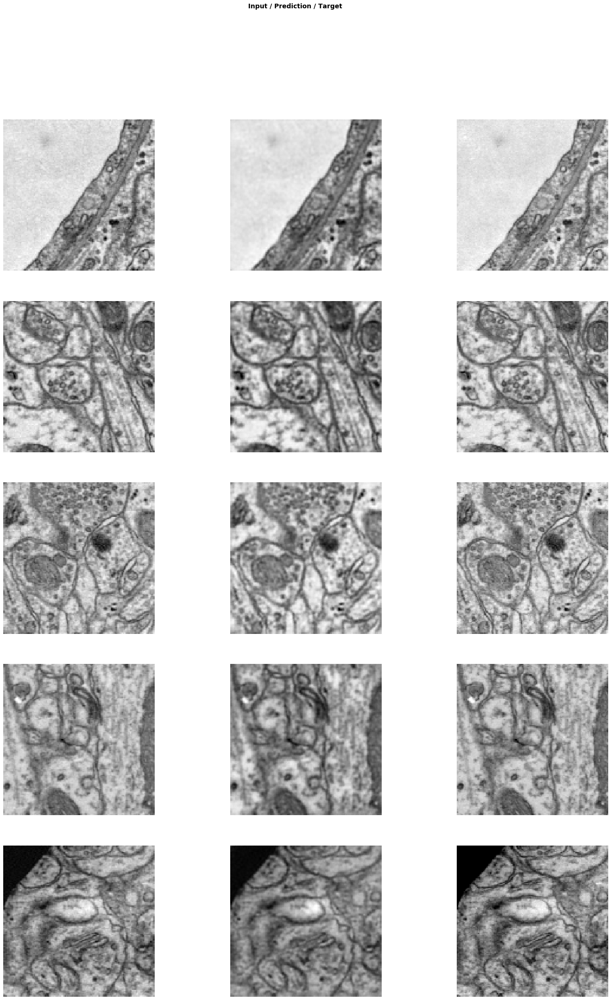

In [17]:
learn.show_results(rows=5, figsize=(25,35), cmap=plt.cm.gray)

### 1b

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


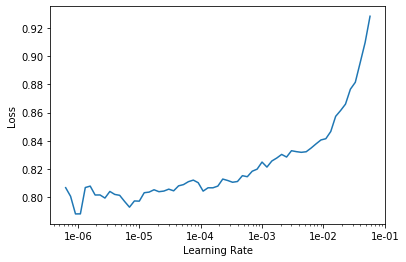

In [18]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

In [19]:
lr = slice(1e-5, 1e-3)
learn.fit_one_cycle(3, max_lr=lr)
learn.save(f'{nb_name}.1b', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,0.832924,0.753732,0.376346,12.571307,0.473219,00:38
1,0.818510,0.723405,0.377714,12.567148,0.486996,00:38
2,0.795661,0.712219,0.373438,12.585437,0.491521,00:38


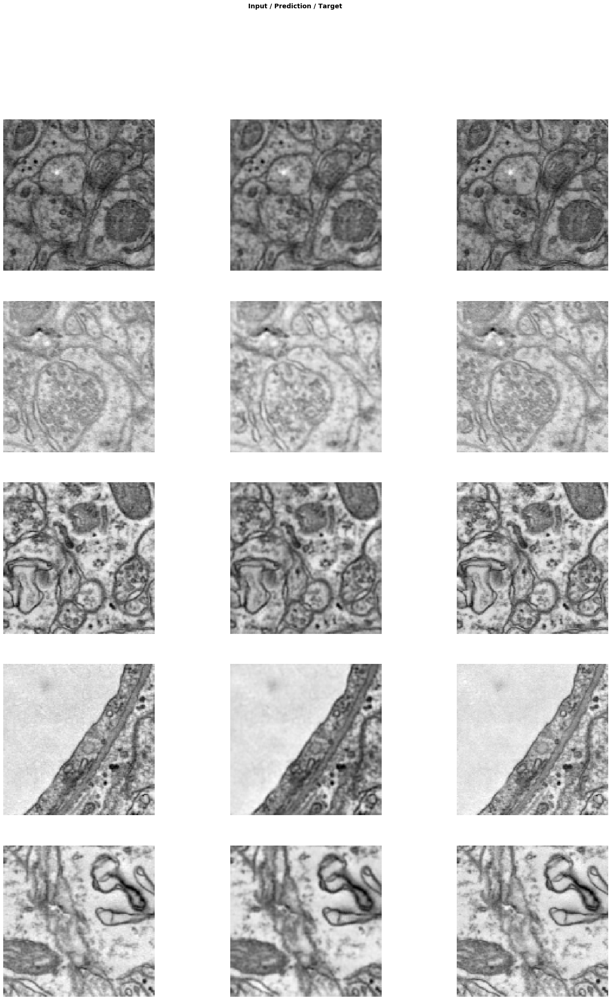

In [20]:
learn.show_results(rows=5, figsize=(25,35), cmap=plt.cm.gray)

## 2a

In [21]:
# 2nd round of data
bs_2 = 32
size_2 = 256
db = get_data(data_pth=data_pth, lr_dir=lr_path, hr_dir=hr_path,
             bs=bs_2, in_sz=size_2, out_sz=size_2, max_zoom=3)
db = subsample(db, seed=6054)

In [22]:
gc.collect()

63

In [23]:
learn.data = db
learn.freeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


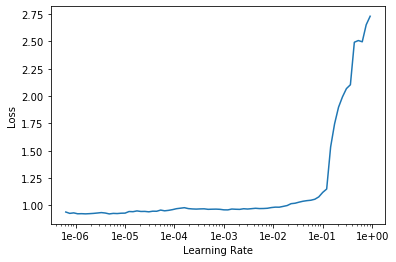

In [24]:
learn.lr_find()
learn.recorder.plot()

In [25]:
lr = 1e-3
learn.fit_one_cycle(3, max_lr=lr)
learn.save(f'{nb_name}.2a', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,0.940450,0.754734,0.362391,12.235871,0.473095,02:11
1,0.934792,0.743895,0.330497,12.526919,0.477872,02:10
2,0.913377,0.729211,0.336957,12.432330,0.485121,02:10


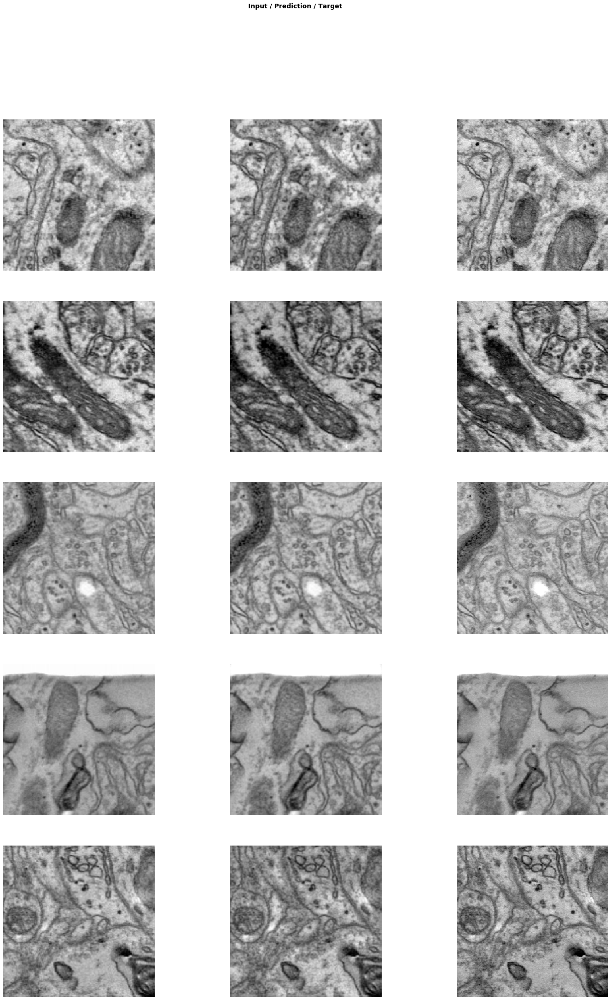

In [26]:
learn.show_results(rows=5, figsize=(25,35), cmap=plt.cm.gray)

## 2b

In [27]:
learn.unfreeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


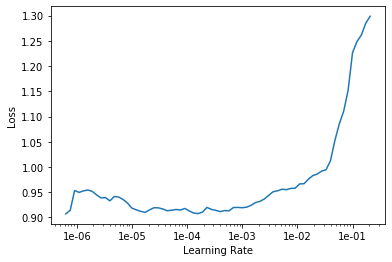

In [28]:
learn.lr_find()
learn.recorder.plot()

In [29]:
lr = slice(1e-5, 1e-3)
learn.fit_one_cycle(3, max_lr=lr)
learn.save(f'{nb_name}.2b', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,0.931032,0.757517,0.339143,12.403590,0.470688,02:16
1,0.939124,0.718510,0.316902,12.720667,0.490119,02:16
2,0.909205,0.719577,0.310873,12.758975,0.489164,02:16


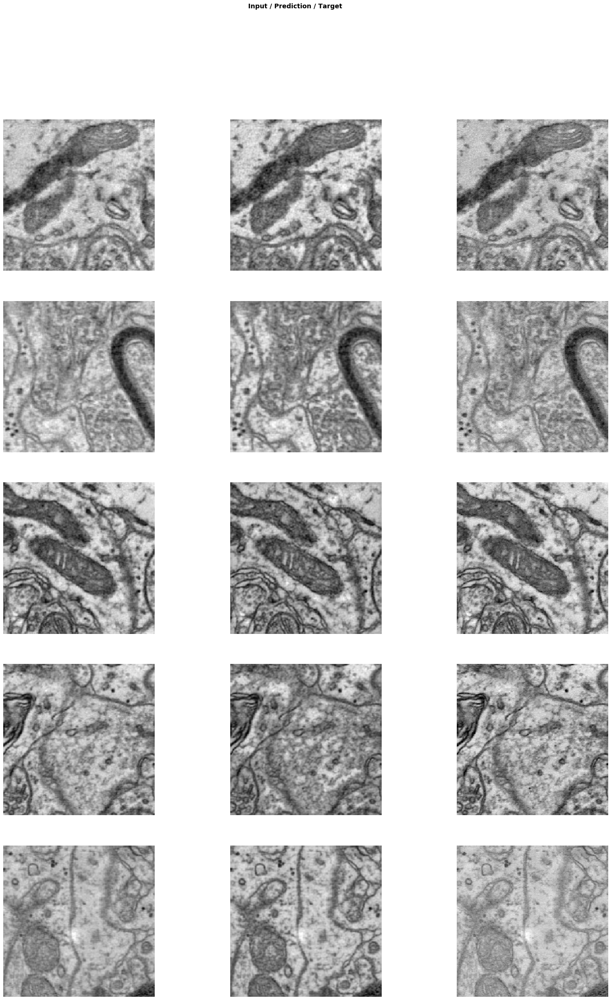

In [30]:
learn.show_results(rows=5, figsize=(25,35), cmap=plt.cm.gray)

## 3a

In [31]:
# 3rd round of data
bs_3 = 16
size_3 = 512
db = get_data(data_pth=data_pth, lr_dir=lr_path, hr_dir=hr_path,
             bs=bs_3, in_sz=size_3, out_sz=size_3, max_zoom=2.)
db = subsample(db, seed=2020)

In [32]:
learn.data = db

In [33]:
learn.freeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


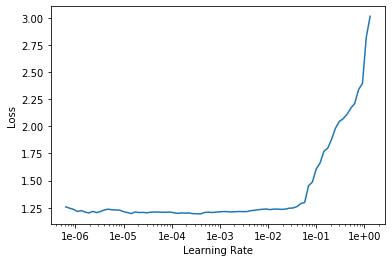

In [34]:
learn.lr_find()
learn.recorder.plot()

In [35]:
lr = 1e-3
learn.fit_one_cycle(3, max_lr=lr)
learn.save(f'{nb_name}.3a', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,1.263320,1.111990,0.404943,12.156728,0.331984,09:12
1,1.220929,1.078378,0.382652,12.337348,0.342968,09:08
2,1.186515,1.068838,0.372279,12.468365,0.346252,09:08


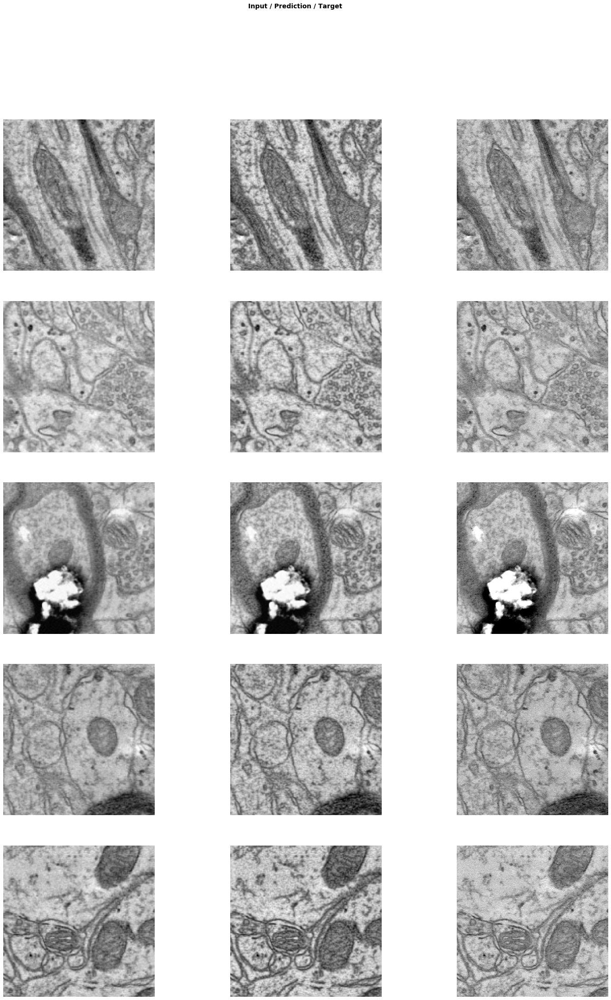

In [36]:
learn.show_results(rows=5, figsize=(25,35), cmap=plt.cm.gray)

### 3b

In [37]:
learn.unfreeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


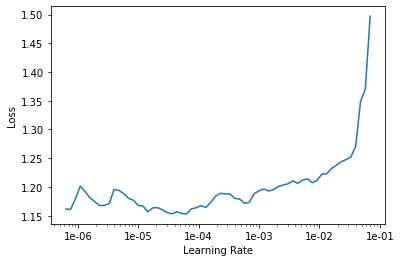

In [38]:
learn.lr_find()
learn.recorder.plot()

In [39]:
lr = 3e-6
learn.fit_one_cycle(3, max_lr=lr)
learn.save(f'{nb_name}.3b', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,1.179821,1.062712,0.355181,12.683077,0.348213,09:31
1,1.197468,1.061154,0.358495,12.612885,0.348872,09:32
2,1.177155,1.059554,0.360999,12.612058,0.349498,09:32


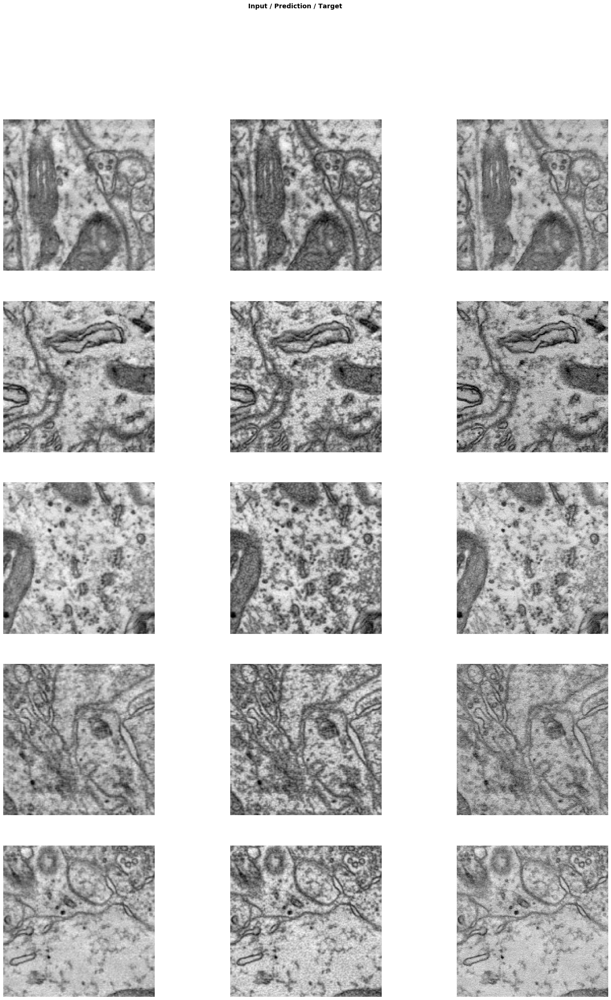

In [40]:
learn.show_results(rows=5, figsize=(25,35), cmap=plt.cm.gray)